<a href="https://colab.research.google.com/github/jonbaer/googlecolab/blob/master/Robolfow_YOLOv5_Ultralytics_Comparison.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction: YOLOv5 Implementation

This notebook is based on the [YOLOv5 repository](https://github.com/ultralytics/yolov5) by [Ultralytics](https://www.ultralytics.com/). This notebook shows training on **your own custom objects**. Many thanks to Ultralytics for putting this repository together - we hope that in combination with clean data management tools at Roboflow, this technologoy will become easily accessible to any developer wishing to use computer vision in their projects.


### Steps Covered in this Notebook

In this notebook, we will walk through the steps required to train YOLOv5 on your custom objects. We use a [public blood cell detection dataset](https://public.roboflow.ai/object-detection/bccd), which is open source and free to use. You can also use this notebook on your own data.

To train our detector we take the following steps:

* Install YOLOv5 dependencies
* Download custom YOLOv5 object detection data
* Write our YOLOv5 Training configuration
* Run YOLOv5 training
* Evaluate YOLOv5 performance
* Visualize YOLOv5 training data
* Run YOLOv5 inference on test images
* Export saved YOLOv5 weights for future inference



### **About**

[Roboflow](https://roboflow.ai) enables teams to create custom computer vision models quickly and accurately. Convert data from to annotation format, assess dataset health, preprocess, augment, and more. It's free for your first 1000 source images.

#### ![Roboflow Workmark](https://i.imgur.com/WHFqYSJ.png)


#Install Dependencies

_(Remember to choose GPU in Runtime if not already selected. Runtime --> Change Runtime Type --> Hardware accelerator --> GPU)_

In [0]:
!git clone https://github.com/roboflow-ai/yolov5  # clone repo, forked via https://github.com/ultralytics/yolov5
!pip install -U -r yolov5/requirements.txt  # install dependencies

Cloning into 'yolov5'...
remote: Enumerating objects: 166, done.
remote: Counting objects: 100% (166/166), done.
remote: Compressing objects: 100% (115/115), done.
remote: Total 307 (delta 110), reused 105 (delta 51), pack-reused 141
Receiving objects: 100% (307/307), 3.08 MiB | 7.93 MiB/s, done.
Resolving deltas: 100% (179/179), done.
     |████████████████████████████████| 20.4MB 1.4MB/s 
     |████████████████████████████████| 28.2MB 77kB/s 
Requirement already up-to-date: torch>=1.5 in /usr/local/lib/python3.6/dist-packages (from -r yolov5/requirements.txt (line 4)) (1.5.0+cu101)
Requirement already up-to-date: matplotlib in /usr/local/lib/python3.6/dist-packages (from -r yolov5/requirements.txt (line 5)) (3.2.1)
Requirement already up-to-date: pycocotools in /usr/local/lib/python3.6/dist-packages (from -r yolov5/requirements.txt (line 6)) (2.0.0)
     |████████████████████████████████| 71kB 11.3MB/s 
     |████████████████████████████████| 2.1MB 51.1MB/s 
Requirement already up-to

In [0]:
# change directory to our newly cloned YOLOv5 folder
%cd /content/yolov5

/content/yolov5


In [0]:
# import requirements
import torch
from IPython.display import Image  # for displaying images
from utils.google_utils import gdrive_download  # for downloading models/datasets

print('torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

torch 1.5.0+cu101 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', major=6, minor=0, total_memory=16280MB, multi_processor_count=56)


# Download Correctly Formatted Custom Dataset 

We'll download our dataset from Roboflow. Use the "**YOLOv5 PyTorch**" export format. Note that the Ultralytics implementation calls for a YAML file defining where your training and test data is. The Roboflow export also writes this format for us.

To get your data into Roboflow, follow the [Getting Started Guide](https://blog.roboflow.ai/getting-started-with-roboflow/).



![YOLOv5 PyTorch export](https://i.imgur.com/5vr9G2u.png)


In [0]:
# Export code snippet and paste here
%cd /content
!curl -L "https://public.roboflow.ai/ds/vJUg9kAnOG?key=YOUR DATASET HERE" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip


/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   896  100   896    0     0   1196      0 --:--:-- --:--:-- --:--:--  1194
100 5082k  100 5082k    0     0  3691k      0  0:00:01  0:00:01 --:--:-- 28.8M
Archive:  roboflow.zip
 extracting: test/images/BloodImage_00334_jpg.rf.3b8a84d57940aeb45e5c2046c8411996.jpg  
 extracting: test/images/BloodImage_00369_jpg.rf.99ae139e5530a25980b7acdd56a4317c.jpg  
 extracting: test/images/BloodImage_00266_jpg.rf.6d62684a33e2f5bc048803aba3177f58.jpg  
 extracting: test/images/BloodImage_00120_jpg.rf.6742a4da047e1226a181d2de2978ce6d.jpg  
 extracting: test/images/BloodImage_00113_jpg.rf.a6d6a75c0ebfc703ecff95e2938be34d.jpg  
 extracting: test/images/BloodImage_00275_jpg.rf.9108b9a016fadd9c367b05dfb0c40c2c.jpg  
 extracting: test/images/BloodImage_00350_jpg.rf.1a19e9f9f197fbeab278718f7c6cea9b.jpg  
 extracting: test/images/BloodImage_

In [0]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 3
names: ['Platelets', 'RBC', 'WBC']

# Define Model Configuration and Architecture

We will write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.

You do not need to edit these cells, but you may.

In [0]:
# define number of classes based on YAML
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [0]:
%cd /content/
##write custom model .yaml
#you can configure this based on other YOLOv5 models in the models directory
with open('yolov5/models/custom_yolov5s.yaml', 'w') as f:
  # parameters
  f.write('nc: ' + num_classes + '\n')
  #f.write('nc: ' + str(len(class_labels)) + '\n')
  f.write('depth_multiple: 0.33'  + '\n') # model depth multiple
  f.write('width_multiple: 0.50'  + '\n')  # layer channel multiple
  f.write('\n')
  f.write('anchors:' + '\n')
  f.write('  - [10,13, 16,30, 33,23] ' + '\n')
  f.write('  - [30,61, 62,45, 59,119]' + '\n')
  f.write('  - [116,90, 156,198, 373,326] ' + '\n')
  f.write('\n')

  f.write('backbone:' + '\n')
  f.write('  [[-1, 1, Focus, [64, 3]],' + '\n')
  f.write('   [-1, 1, Conv, [128, 3, 2]],' + '\n')
  f.write('   [-1, 3, Bottleneck, [128]],' + '\n')
  f.write('   [-1, 1, Conv, [256, 3, 2]],' + '\n')
  f.write('   [-1, 9, BottleneckCSP, [256]],' + '\n')
  f.write('   [-1, 1, Conv, [512, 3, 2]], ' + '\n')
  f.write('   [-1, 9, BottleneckCSP, [512]],' + '\n')
  f.write('   [-1, 1, Conv, [1024, 3, 2]],' + '\n')
  f.write('   [-1, 1, SPP, [1024, [5, 9, 13]]],' + '\n')
  f.write('   [-1, 6, BottleneckCSP, [1024]],' + '\n')
  f.write('  ]' + '\n')
  f.write('\n')

  f.write('head:'  + '\n')
  f.write('  [[-1, 3, BottleneckCSP, [1024, False]],'  + '\n')
  f.write('   [-1, 1, nn.Conv2d, [na * (nc + 5), 1, 1, 0]],' + '\n')
  f.write('   [-2, 1, nn.Upsample, [None, 2, "nearest"]],' + '\n')
  
  f.write('   [[-1, 6], 1, Concat, [1]],' + '\n')
  f.write('   [-1, 1, Conv, [512, 1, 1]],' + '\n')
  f.write('   [-1, 3, BottleneckCSP, [512, False]],' + '\n')
  f.write('   [-1, 1, nn.Conv2d, [na * (nc + 5), 1, 1, 0]],' + '\n')
  
  f.write('   [-2, 1, nn.Upsample, [None, 2, "nearest"]],' + '\n')
  f.write('   [[-1, 4], 1, Concat, [1]],' + '\n')
  f.write('   [-1, 1, Conv, [256, 1, 1]],' + '\n')
  f.write('   [-1, 3, BottleneckCSP, [256, False]],' + '\n')
  f.write('   [-1, 1, nn.Conv2d, [na * (nc + 5), 1, 1, 0]],' + '\n')
  f.write('\n' )
  f.write('   [[], 1, Detect, [nc, anchors]],' + '\n')
  f.write('  ]' + '\n')

print('custom model config written!')

/content
custom model config written!


# Train Custom YOLOv5 Detector

### Next, we'll fire off training!


Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive [folder](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J))
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [0]:
# train yolov5s on custom data for 50 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 200 --data '../data.yaml' --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results --nosave --cache

/content/yolov5
Apex recommended for faster mixed precision training: https://github.com/NVIDIA/apex
{'lr0': 0.01, 'momentum': 0.937, 'weight_decay': 0.0005, 'giou': 0.05, 'cls': 0.58, 'cls_pw': 1.0, 'obj': 1.0, 'obj_pw': 1.0, 'iou_t': 0.2, 'anchor_t': 4.0, 'fl_gamma': 0.0, 'hsv_h': 0.014, 'hsv_s': 0.68, 'hsv_v': 0.36, 'degrees': 0.0, 'translate': 0.0, 'scale': 0.5, 'shear': 0.0}
Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='././models/custom_yolov5s.yaml', data='./../data.yaml', device='', epochs=200, evolve=False, img_size=[416], multi_scale=False, name='yolov5s_results', nosave=True, notest=False, rect=False, resume=False, single_cls=False, weights='')
Using CUDA device0 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', total_memory=16280MB)

2020-06-11 20:48:53.097467: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.1
Start Tensorboard with "tensorboard --logdir=runs", view at http://loca

# Evaluate Custom YOLOv5 Detector Performance

Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the **--name** flag when we train. In our case, we named this `yolov5s_results`. (If given no name, it defaults to `results.txt`.) The results file is plotted as a png after training completes.

Note from Glenn: Partially completed `results.txt` files can be plotted with `from utils.utils import plot_results; plot_results()`.

In [0]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

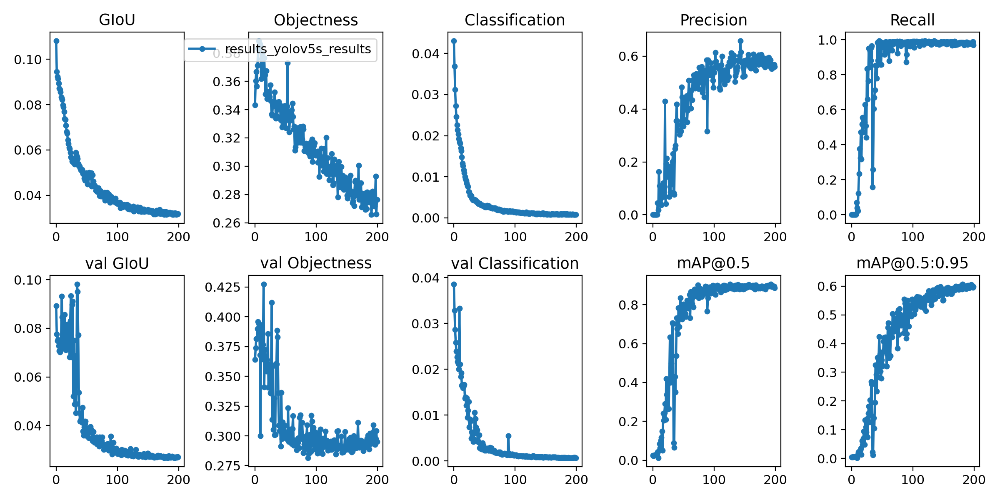

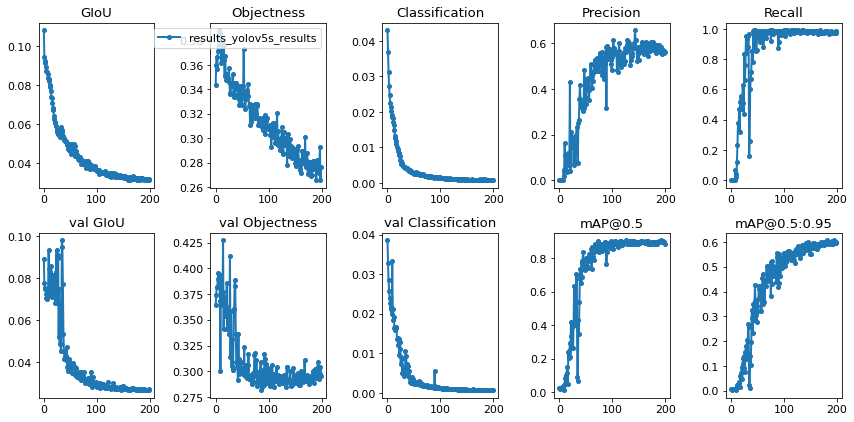

In [0]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
from utils.utils import plot_results; plot_results()  # plot results.txt as results.png
Image(filename='./results.png', width=1000)  # view results.png

### Curious? Visualize Our Training Data with Labels

After training starts, view `train*.jpg` images to see training images, labels and augmentation effects.

Note a mosaic dataloader is used for training (shown below), a new dataloading concept developed by Glenn Jocher and first featured in [YOLOv4](https://arxiv.org/abs/2004.10934).

GROUND TRUTH TRAINING DATA:


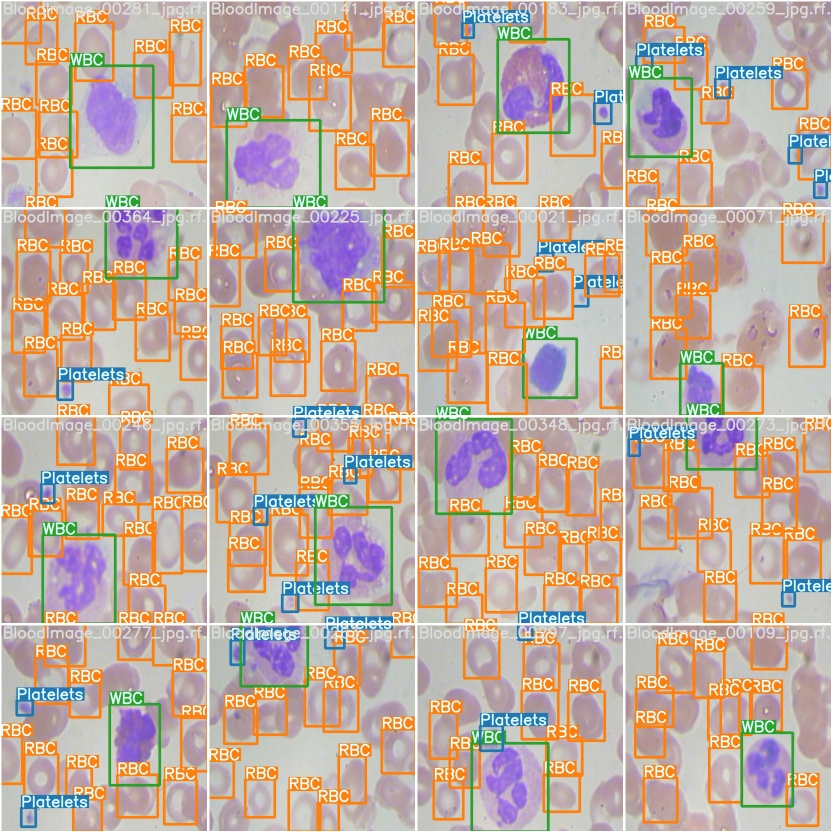

In [0]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='./test_batch0_gt.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


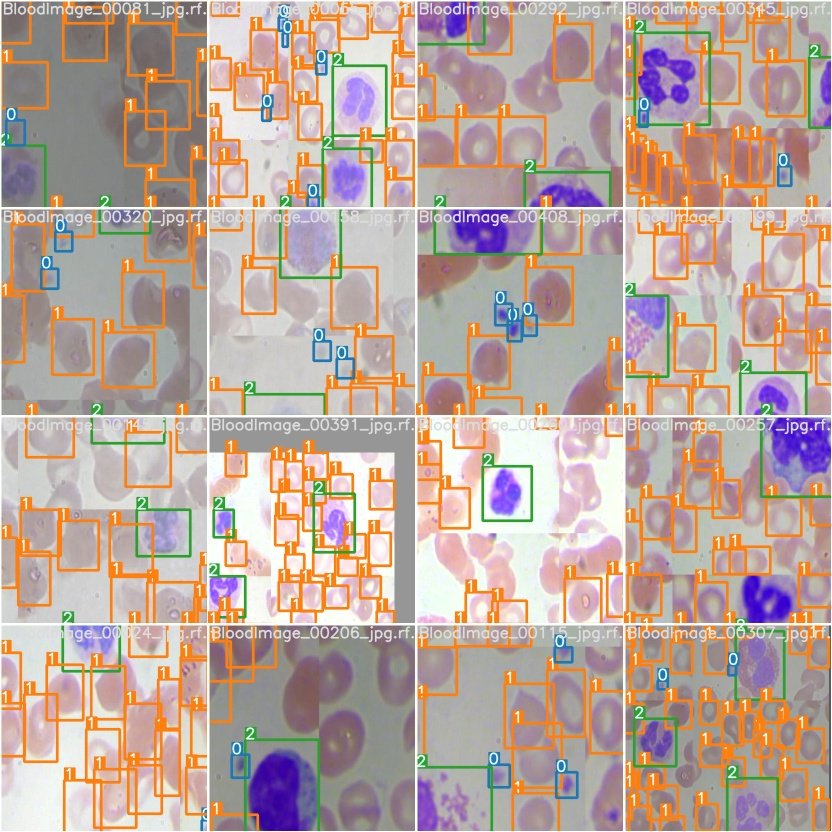

In [0]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='./train_batch2.jpg', width=900)

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [0]:
# trained weights are saved by default in our weights folder
%ls weights/

download_weights.sh  last_yolov5s_results.pt


In [0]:
!du weights/last_yolov5s_results.pt

27076	weights/last_yolov5s_results.pt


In [0]:
%ls ../test/images

BloodImage_00038_jpg.rf.63da20f3f5538d0d2be8c4633c7034a1.jpg
BloodImage_00044_jpg.rf.b0e2369642c5a7fa434ed8defa79e2ba.jpg
BloodImage_00062_jpg.rf.e965ee152eea462d82706a2709abfe00.jpg
BloodImage_00090_jpg.rf.4fd1da847d2857b6092003c41255ea4c.jpg
BloodImage_00099_jpg.rf.5b178d758af2a97d3df8e5f87b1f344a.jpg
BloodImage_00112_jpg.rf.f8d86689750221da637a054843c72822.jpg
BloodImage_00113_jpg.rf.a6d6a75c0ebfc703ecff95e2938be34d.jpg
BloodImage_00120_jpg.rf.6742a4da047e1226a181d2de2978ce6d.jpg
BloodImage_00133_jpg.rf.06c3705fcfe2fcaee19e1a076e511508.jpg
BloodImage_00134_jpg.rf.ee0308b1f3e1ffbb048cb3b1f80e8e36.jpg
BloodImage_00154_jpg.rf.7c682b32a64ca0520b6fc725f0d667c7.jpg
BloodImage_00160_jpg.rf.500f16e32681898ca1ce052ea0402c08.jpg
BloodImage_00190_jpg.rf.03484116dcad7715c77d30654056fc54.jpg
BloodImage_00191_jpg.rf.d4b5ad6525c6c0bc4eaea1f24901f396.jpg
BloodImage_00204_jpg.rf.6c3c9e37ab9122b026444cc4e685aef1.jpg
BloodImage_00227_jpg.rf.1572183909350ffe748751e967b7c8e5.jpg
BloodImage_00235_jpg.rf.

In [0]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
%cd /content/yolov5/
!python detect.py --weights weights/last_yolov5s_results.pt --img 416 --conf 0.4 --source ../test/images


/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', fourcc='mp4v', half=False, img_size=416, iou_thres=0.5, output='inference/output', save_txt=False, source='../test/images', view_img=False, weights='weights/last_yolov5s_results.pt')
Using CUDA device0 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', total_memory=16280MB)

image 1/36 ../test/images/BloodImage_00038_jpg.rf.63da20f3f5538d0d2be8c4633c7034a1.jpg: 416x416 1 Plateletss, 24 RBCs, 1 WBCs, Done. (0.011s)
image 2/36 ../test/images/BloodImage_00044_jpg.rf.b0e2369642c5a7fa434ed8defa79e2ba.jpg: 416x416 3 Plateletss, 19 RBCs, 2 WBCs, Done. (0.008s)
image 3/36 ../test/images/BloodImage_00062_jpg.rf.e965ee152eea462d82706a2709abfe00.jpg: 416x416 1 Plateletss, 16 RBCs, 1 WBCs, Done. (0.007s)
image 4/36 ../test/images/BloodImage_00090_jpg.rf.4fd1da847d2857b6092003c41255ea4c.jpg: 416x416 3 Plateletss, 14 RBCs, 1 WBCs, Done. (0.007s)
image 5/36 ../test/images/BloodImage_00099_jpg.rf.5b17

In [0]:
!python detect.py --weights weights/last_yolov5s_results.pt --img 416 --conf 0.4 --source ../test/images/BloodImage_00337_jpg.rf.7959cb18929c970939cda4a9544547c8.jpg


Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', fourcc='mp4v', half=False, img_size=416, iou_thres=0.5, output='inference/output', save_txt=False, source='../test/images/BloodImage_00337_jpg.rf.7959cb18929c970939cda4a9544547c8.jpg', view_img=False, weights='weights/last_yolov5s_results.pt')
Using CUDA device0 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', total_memory=16280MB)

image 1/1 ../test/images/BloodImage_00337_jpg.rf.7959cb18929c970939cda4a9544547c8.jpg: 416x416 21 RBCs, 1 WBCs, Done. (0.019s)
Results saved to /content/yolov5/inference/output
Done. (0.062s)


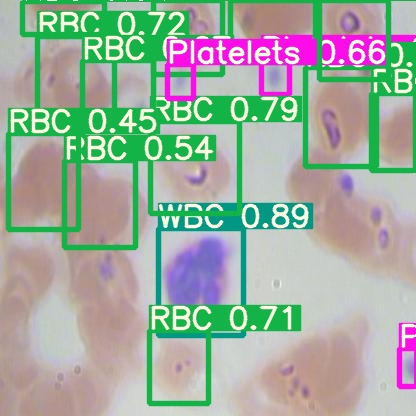

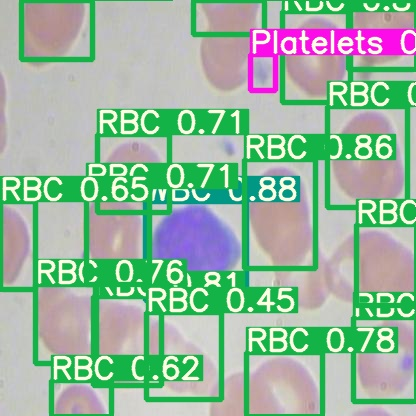

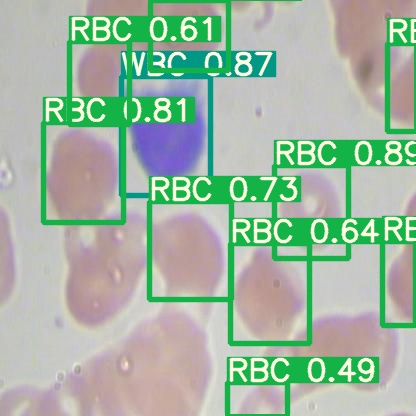

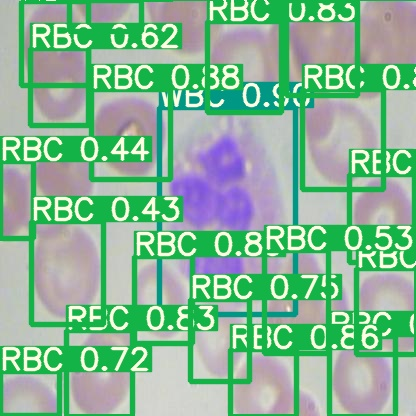

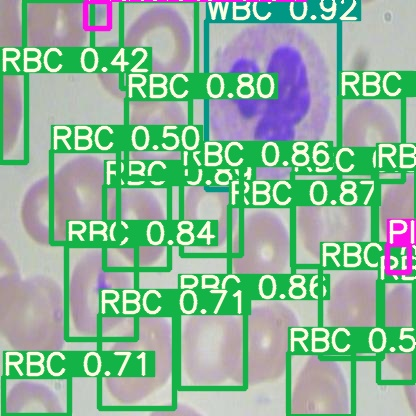

...

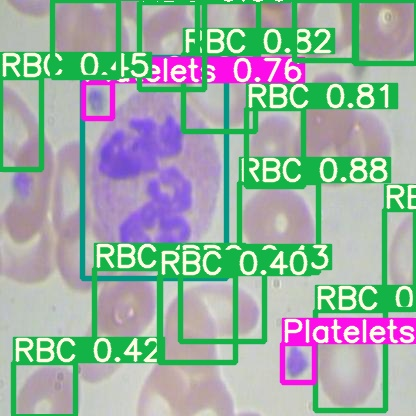

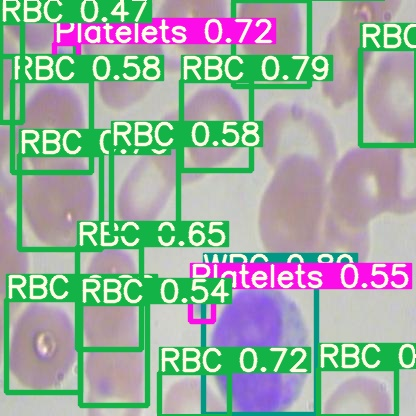

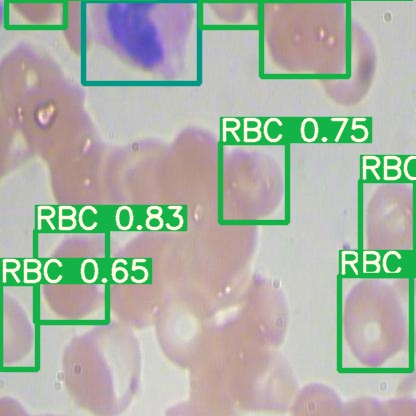

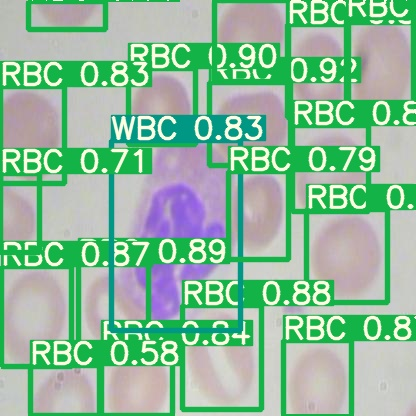

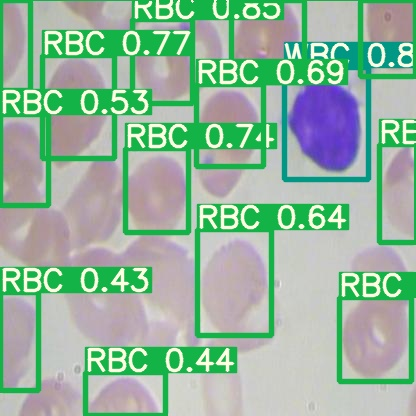

In [0]:
#display inference on ALL test images
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/inference/output/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Export Trained Weights for Future Inference

Now that you have trained your custom detector, you can export the trained weights you have made here for inference on your device elsewhere

In [0]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
%cp /content/yolov5/weights/last_yolov5s_results.pt /content/gdrive/My\ Drive

## Congrats!

Hope you enjoyed this!

--Team [Roboflow](https://roboflow.ai)